In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python

#load packages
import sys #access to system parameters https://docs.python.org/3/library/sys.html
print("Python version: {}". format(sys.version))

import pandas as pd #collection of functions for data processing and analysis modeled after R dataframes with SQL like features
print("pandas version: {}". format(pd.__version__))

import matplotlib #collection of functions for scientific and publication-ready visualization
print("matplotlib version: {}". format(matplotlib.__version__))

import numpy as np #foundational package for scientific computing
print("NumPy version: {}". format(np.__version__))

import scipy as sp #collection of functions for scientific computing and advance mathematics
print("SciPy version: {}". format(sp.__version__)) 

import IPython
from IPython import display #pretty printing of dataframes in Jupyter notebook
print("IPython version: {}". format(IPython.__version__)) 

import sklearn #collection of machine learning algorithms
print("scikit-learn version: {}". format(sklearn.__version__))

#misc libraries
import random
import time


#ignore warnings
import warnings
warnings.filterwarnings('ignore')
print('-'*25)



# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

from subprocess import check_output
print(check_output(["ls", "../input"]).decode("utf8"))

# Any results you write to the current directory are saved as output.

Python version: 3.7.6 | packaged by conda-forge | (default, Mar 23 2020, 23:03:20) 
[GCC 7.3.0]
pandas version: 1.1.4
matplotlib version: 3.2.1
NumPy version: 1.17.5
SciPy version: 1.4.1
IPython version: 7.13.0
scikit-learn version: 0.23.2
-------------------------
titanic



In [2]:
#use matplotlib and seaborn for data visualization
#common model algorithms
from sklearn import svm,tree,linear_model,neighbors,naive_bayes,ensemble,discriminant_analysis,gaussian_process
from xgboost import XGBClassifier
#common model helpers
from sklearn.preprocessing import OneHotEncoder,LabelEncoder
from sklearn import feature_selection
from sklearn import model_selection
from sklearn import metrics
#visualization
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
import seaborn as sns
from pandas.plotting import scatter_matrix

#configure visualization defaults
%matplotlib inline
mpl.style.use('ggplot')
sns.set_style('white')
pylab.rcParams['figure.figsize'] = 12,8

In [3]:
data_raw = pd.read_csv('../input/titanic/train.csv')
data_val = pd.read_csv('../input/titanic/test.csv')
data1 = data_raw.copy(deep=True) #dataをいじる
data_cleaner = [data1,data_val] #データを綺麗にするには参照渡しが楽
print(data_raw.info())
data_raw.sample(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB
None


,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
424,425,0,3,"Rosblom, Mr. Viktor Richard",male,18.0,1,1,370129,20.2125,NaN,S
654,655,0,3,"Hegarty, Miss. Hanora ""Nora""",female,18.0,0,0,365226,6.7500,NaN,Q
178,179,0,2,"Hale, Mr. Reginald",male,30.0,0,0,250653,13.0000,NaN,S
126,127,0,3,"McMahon, Mr. Martin",male,NaN,0,0,370372,7.7500,NaN,Q
766,767,0,1,"Brewe, Dr. Arthur Jackson",male,NaN,0,0,112379,39.6000,NaN,C
712,713,1,1,"Taylor, Mr. Elmer Zebley",male,48.0,1,0,19996,52.0000,C126,S
181,182,0,2,"Pernot, Mr. Rene",male,NaN,0,0,SC/PARIS 2131,15.0500,NaN,C
636,637,0,3,"Leinonen, Mr. Antti Gustaf",male,32.0,0,0,STON/O 2. 3101292,7.9250,NaN,S
725,726,0,3,"Oreskovic, Mr. Luka",male,20.0,0,0,315094,8.6625,NaN,S
476,477,0,2,"Renouf, Mr. Peter Henry",male,34.0,1,0,31027,21.0000,NaN,S


In [4]:
print('Train columns with null values:\n',data1.isnull().sum())
print("-"*10)

print('Test/Validation columns with null values:\n',data_val.isnull().sum())
print("-"*10)

data_raw.describe(include='all')

Train columns with null values:
 PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64
----------
Test/Validation columns with null values:
 PassengerId      0
Pclass           0
Name             0
Sex              0
Age             86
SibSp            0
Parch            0
Ticket           0
Fare             1
Cabin          327
Embarked         0
dtype: int64
----------


,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
count,891.000000,891.000000,891.000000,891,891,714.000000,891.000000,891.000000,891,891.000000,204,889
unique,NaN,NaN,NaN,891,2,NaN,NaN,NaN,681,NaN,147,3
top,NaN,NaN,NaN,"Leeni, Mr. Fahim (""Philip Zenni"")",male,NaN,NaN,NaN,1601,NaN,B96 B98,S
freq,NaN,NaN,NaN,1,577,NaN,NaN,NaN,7,NaN,4,644
mean,446.000000,0.383838,2.308642,NaN,NaN,29.699118,0.523008,0.381594,NaN,32.204208,NaN,NaN
std,257.353842,0.486592,0.836071,NaN,NaN,14.526497,1.102743,0.806057,NaN,49.693429,NaN,NaN
min,1.000000,0.000000,1.000000,NaN,NaN,0.420000,0.000000,0.000000,NaN,0.000000,NaN,NaN
25%,223.500000,0.000000,2.000000,NaN,NaN,20.125000,0.000000,0.000000,NaN,7.910400,NaN,NaN
50%,446.000000,0.000000,3.000000,NaN,NaN,28.000000,0.000000,0.000000,NaN,14.454200,NaN,NaN
75%,668.500000,1.000000,3.000000,NaN,NaN,38.000000,1.000000,0.000000,NaN,31.000000,NaN,NaN


In [5]:
for dataset in data_cleaner:
    #data completing
    dataset['Age'].fillna(dataset['Age'].median(),inplace=True)
    dataset['Embarked'].fillna(dataset['Embarked'].mode()[0],inplace=True)
    dataset['Fare'].fillna(dataset['Fare'].median(),inplace=True)
    #delete features
    
drop_column = ['PassengerId','Cabin', 'Ticket']
data1.drop(drop_column, axis=1, inplace = True)
print(data1.isnull().sum())
print("-"*10)
print(data_val.isnull().sum())

Survived    0
Pclass      0
Name        0
Sex         0
Age         0
SibSp       0
Parch       0
Fare        0
Embarked    0
dtype: int64
----------
PassengerId      0
Pclass           0
Name             0
Sex              0
Age              0
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          327
Embarked         0
dtype: int64


In [6]:
#CRETA:Feature Enginnering for train and test/validation dataset
for dataset in data_cleaner:
    dataset['FamilySize'] = dataset['SibSp'] + dataset['Parch'] + 1
    dataset['IsAlone'] = 1#initialize
    dataset['IsAlone'].loc[dataset['FamilySize'] > 1] = 0
    
    dataset['Title'] = dataset['Name'].str.split(", ", expand=True)[1].str.split(".", expand=True)[0]
    dataset['FareBin'] = pd.qcut(dataset['Fare'],4)
    dataset['AgeBin'] = pd.cut(dataset['Age'].astype(int),5)#世代特徴量

#cleanup rare title names
stat_min = 10
title_names = (data1['Title'].value_counts() < stat_min) #this will create a true false series with title name as index

data1['Title'] = data1['Title'].apply(lambda x: 'Misc' if title_names.loc[x] == True else x)
print('after cleanup rare title names')
print(data1['Title'].value_counts())
print("-"*10)

data1.info()
data_val.info()
data1.sample(10)

after cleanup rare title names
Mr        517
Miss      182
Mrs       125
Master     40
Misc       27
Name: Title, dtype: int64
----------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 14 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   Survived    891 non-null    int64   
 1   Pclass      891 non-null    int64   
 2   Name        891 non-null    object  
 3   Sex         891 non-null    object  
 4   Age         891 non-null    float64 
 5   SibSp       891 non-null    int64   
 6   Parch       891 non-null    int64   
 7   Fare        891 non-null    float64 
 8   Embarked    891 non-null    object  
 9   FamilySize  891 non-null    int64   
 10  IsAlone     891 non-null    int64   
 11  Title       891 non-null    object  
 12  FareBin     891 non-null    category
 13  AgeBin      891 non-null    category
dtypes: category(2), float64(2), int64(6), object(4)
memory usage: 85.8+ KB
<class 'p

,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Fare,Embarked,FamilySize,IsAlone,Title,FareBin,AgeBin
691,1,3,"Karun, Miss. Manca",female,4.0,0,1,13.4167,C,2,0,Miss,"(7.91, 14.454]","(-0.08, 16.0]"
510,1,3,"Daly, Mr. Eugene Patrick",male,29.0,0,0,7.7500,Q,1,1,Mr,"(-0.001, 7.91]","(16.0, 32.0]"
36,1,3,"Mamee, Mr. Hanna",male,28.0,0,0,7.2292,C,1,1,Mr,"(-0.001, 7.91]","(16.0, 32.0]"
168,0,1,"Baumann, Mr. John D",male,28.0,0,0,25.9250,S,1,1,Mr,"(14.454, 31.0]","(16.0, 32.0]"
329,1,1,"Hippach, Miss. Jean Gertrude",female,16.0,0,1,57.9792,C,2,0,Miss,"(31.0, 512.329]","(-0.08, 16.0]"
546,1,2,"Beane, Mrs. Edward (Ethel Clarke)",female,19.0,1,0,26.0000,S,2,0,Mrs,"(14.454, 31.0]","(16.0, 32.0]"
599,1,1,"Duff Gordon, Sir. Cosmo Edmund (""Mr Morgan"")",male,49.0,1,0,56.9292,C,2,0,Misc,"(31.0, 512.329]","(48.0, 64.0]"
31,1,1,"Spencer, Mrs. William Augustus (Marie Eugenie)",female,28.0,1,0,146.5208,C,2,0,Mrs,"(31.0, 512.329]","(16.0, 32.0]"
888,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,28.0,1,2,23.4500,S,4,0,Miss,"(14.454, 31.0]","(16.0, 32.0]"
862,1,1,"Swift, Mrs. Frederick Joel (Margaret Welles Ba...",female,48.0,0,0,25.9292,S,1,1,Mrs,"(14.454, 31.0]","(32.0, 48.0]"


In [7]:
#Convert object to category using label encoder for train and test/validation dataset
label = LabelEncoder()
for dataset in data_cleaner:
    dataset['Sex_Code'] = label.fit_transform(dataset['Sex'])
    dataset['Embarked_Code'] = label.fit_transform(dataset['Embarked'])
    dataset['Title_Code'] = label.fit_transform(dataset['Title'])
    dataset['AgeBin_Code'] = label.fit_transform(dataset['AgeBin'])
    dataset['FareBin_Code'] = label.fit_transform(dataset['FareBin'])
    
#define y variable aka target/outcome
Target = ['Survived']
#define x variables for original features aka feature selection
data1_x = ['Sex','Pclass','Embarked','Title','SibSp','Parch','Age','Fare','FamilySize','IsAlone']#pretty name/values for charts
data1_x_calc = ['Sex_Code','Pclass','Embarked_Code','Title_Code','SibSp','Parch','Age','Fare']#coded for algorithm caluculation
data1_xy = Target + data1_x
print('Original X Y: ',data1_xy,'\n')

#define x variable for original w/bin features to remove continuous variables
data1_x_bin = ['Sex_Code','Pclass','Embarked_Code','Title_Code','FamilySize','AgeBin_Code','FareBin_Code']
data1_xy_bin = Target + data1_x_bin
print('Bin X Y: ',data1_xy_bin,'\n')

#define x  and y variables for dnummy features original
data1_dummy = pd.get_dummies(data1[data1_x])
data1_x_dummy = data1_dummy.columns.tolist()
data1_xy_dummy = Target + data1_x_dummy
print('Dummy X Y: ',data1_xy_dummy, '\n')

data1_dummy.head()

Original X Y:  ['Survived', 'Sex', 'Pclass', 'Embarked', 'Title', 'SibSp', 'Parch', 'Age', 'Fare', 'FamilySize', 'IsAlone'] 

Bin X Y:  ['Survived', 'Sex_Code', 'Pclass', 'Embarked_Code', 'Title_Code', 'FamilySize', 'AgeBin_Code', 'FareBin_Code'] 

Dummy X Y:  ['Survived', 'Pclass', 'SibSp', 'Parch', 'Age', 'Fare', 'FamilySize', 'IsAlone', 'Sex_female', 'Sex_male', 'Embarked_C', 'Embarked_Q', 'Embarked_S', 'Title_Master', 'Title_Misc', 'Title_Miss', 'Title_Mr', 'Title_Mrs'] 



,Pclass,SibSp,Parch,Age,Fare,FamilySize,IsAlone,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S,Title_Master,Title_Misc,Title_Miss,Title_Mr,Title_Mrs
0,3,1,0,22.0,7.2500,2,0,0,1,0,0,1,0,0,0,1,0
1,1,1,0,38.0,71.2833,2,0,1,0,1,0,0,0,0,0,0,1
2,3,0,0,26.0,7.9250,1,1,1,0,0,0,1,0,0,1,0,0
3,1,1,0,35.0,53.1000,2,0,1,0,0,0,1,0,0,0,0,1
4,3,0,0,35.0,8.0500,1,1,0,1,0,0,1,0,0,0,1,0


In [8]:
print('Train columns with null values: \n', data1.isnull().sum())
print("-"*10)
print (data1.info())
print("-"*10)

print('Test/Validation columns with null values: \n', data_val.isnull().sum())
print("-"*10)
print (data_val.info())
print("-"*10)

data_raw.describe(include = 'all')

Train columns with null values: 
 Survived         0
Pclass           0
Name             0
Sex              0
Age              0
SibSp            0
Parch            0
Fare             0
Embarked         0
FamilySize       0
IsAlone          0
Title            0
FareBin          0
AgeBin           0
Sex_Code         0
Embarked_Code    0
Title_Code       0
AgeBin_Code      0
FareBin_Code     0
dtype: int64
----------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   Survived       891 non-null    int64   
 1   Pclass         891 non-null    int64   
 2   Name           891 non-null    object  
 3   Sex            891 non-null    object  
 4   Age            891 non-null    float64 
 5   SibSp          891 non-null    int64   
 6   Parch          891 non-null    int64   
 7   Fare           891 non-null    float64 
 8   Embarked       891 no

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
count,891.000000,891.000000,891.000000,891,891,714.000000,891.000000,891.000000,891,891.000000,204,889
unique,NaN,NaN,NaN,891,2,NaN,NaN,NaN,681,NaN,147,3
top,NaN,NaN,NaN,"Leeni, Mr. Fahim (""Philip Zenni"")",male,NaN,NaN,NaN,1601,NaN,B96 B98,S
freq,NaN,NaN,NaN,1,577,NaN,NaN,NaN,7,NaN,4,644
mean,446.000000,0.383838,2.308642,NaN,NaN,29.699118,0.523008,0.381594,NaN,32.204208,NaN,NaN
std,257.353842,0.486592,0.836071,NaN,NaN,14.526497,1.102743,0.806057,NaN,49.693429,NaN,NaN
min,1.000000,0.000000,1.000000,NaN,NaN,0.420000,0.000000,0.000000,NaN,0.000000,NaN,NaN
25%,223.500000,0.000000,2.000000,NaN,NaN,20.125000,0.000000,0.000000,NaN,7.910400,NaN,NaN
50%,446.000000,0.000000,3.000000,NaN,NaN,28.000000,0.000000,0.000000,NaN,14.454200,NaN,NaN
75%,668.500000,1.000000,3.000000,NaN,NaN,38.000000,1.000000,0.000000,NaN,31.000000,NaN,NaN


In [9]:
train1_x,test1_x,train1_y,test1_y = model_selection.train_test_split(data1[data1_x_calc],data1[Target],random_state=618)
train1_x_bin,test1_x_bin,train1_y_bin,test1_y_bin = model_selection.train_test_split(data1[data1_x_bin],data1[Target],random_state=618)
train1_x_dummy, test1_x_dummy, train1_y_dummy, test1_y_dummy = model_selection.train_test_split(data1_dummy[data1_x_dummy], data1[Target], random_state=618)

print("Data1 Shape: {}".format(data1.shape))
print("Train1 Shape: {}".format(train1_x.shape))
print("Test1 Shape: {}".format(test1_x.shape))

train1_x_bin.head()

Data1 Shape: (891, 19)
Train1 Shape: (668, 8)
Test1 Shape: (223, 8)


,Sex_Code,Pclass,Embarked_Code,Title_Code,FamilySize,AgeBin_Code,FareBin_Code
843,1,3,0,3,1,2,0
686,1,3,2,3,6,0,3
354,1,3,0,3,1,1,0
586,1,2,2,3,1,2,2
490,1,3,2,3,2,1,2


In [10]:
#Discrete Variable Correlation by Survival using
for x in data1_x:
    if data1[x].dtype != 'float64':
        print('Survival Correlation by:',x)
        print(data1[[x,Target[0]]].groupby(x,as_index=False).mean())
        print('-'*10,'\n')

print(pd.crosstab(data1['Title'],data1[Target[0]]))


Survival Correlation by: Sex
      Sex  Survived
0  female  0.742038
1    male  0.188908
---------- 

Survival Correlation by: Pclass
   Pclass  Survived
0       1  0.629630
1       2  0.472826
2       3  0.242363
---------- 

Survival Correlation by: Embarked
  Embarked  Survived
0        C  0.553571
1        Q  0.389610
2        S  0.339009
---------- 

Survival Correlation by: Title
    Title  Survived
0  Master  0.575000
1    Misc  0.444444
2    Miss  0.697802
3      Mr  0.156673
4     Mrs  0.792000
---------- 

Survival Correlation by: SibSp
   SibSp  Survived
0      0  0.345395
1      1  0.535885
2      2  0.464286
3      3  0.250000
4      4  0.166667
5      5  0.000000
6      8  0.000000
---------- 

Survival Correlation by: Parch
   Parch  Survived
0      0  0.343658
1      1  0.550847
2      2  0.500000
3      3  0.600000
4      4  0.000000
5      5  0.200000
6      6  0.000000
---------- 

Survival Correlation by: FamilySize
   FamilySize  Survived
0           1  0.303538
1 

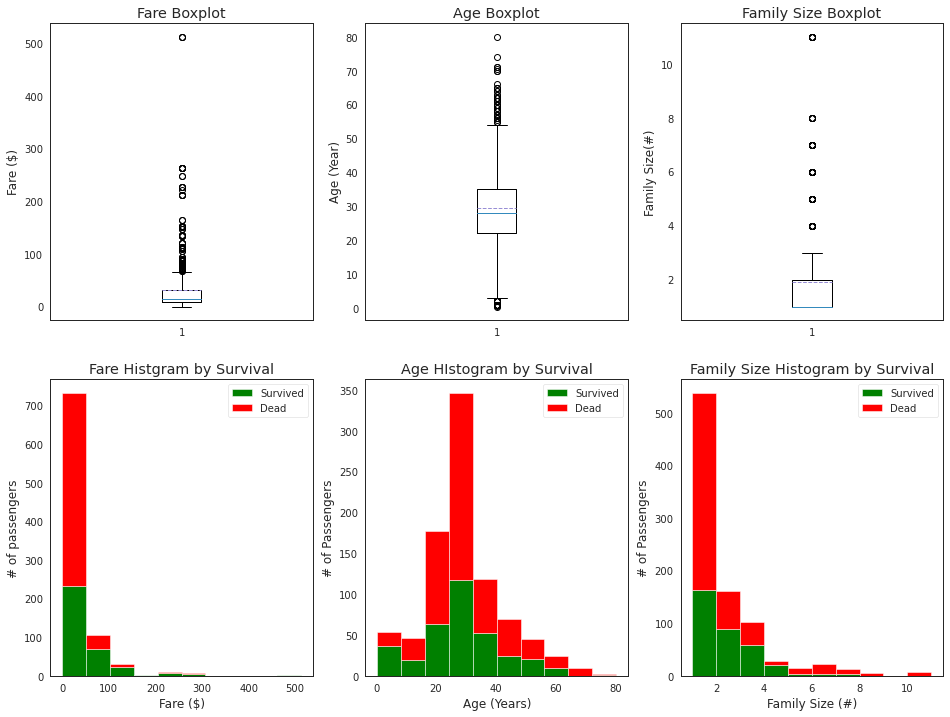

In [12]:
plt.figure(figsize=[16,12])

plt.subplot(231)
plt.boxplot(x=data1['Fare'],showmeans = True,meanline=True)
plt.title('Fare Boxplot')
plt.ylabel('Fare ($)')
        
plt.subplot(232)
plt.boxplot(data1['Age'],showmeans = True,meanline=True)
plt.title('Age Boxplot')
plt.ylabel('Age (Year)')

plt.subplot(233)
plt.boxplot(data1['FamilySize'],showmeans=True,meanline=True)
plt.title('Family Size Boxplot')
plt.ylabel('Family Size(#)')

plt.subplot(234)
plt.hist(x=[data1[data1['Survived']==1]['Fare'],data1[data1['Survived']==0]['Fare']],stacked=True,color=['g','r'],label=['Survived','Dead'])
plt.title('Fare Histgram by Survival')
plt.xlabel('Fare ($)')
plt.ylabel('# of passengers')
plt.legend()

plt.subplot(235)
plt.hist(x=[data1[data1['Survived']==1]['Age'],data1[data1['Survived']==0]['Age']],stacked=True,color=['g','r'],label=['Survived','Dead'])
plt.title('Age HIstogram by Survival')
plt.xlabel('Age (Years)')
plt.ylabel('# of Passengers')
plt.legend()

plt.subplot(236)
plt.hist(x = [data1[data1['Survived']==1]['FamilySize'],data1[data1['Survived']==0]['FamilySize']],stacked=True,color=['g','r'],label=['Survived','Dead'])
plt.title('Family Size Histogram by Survival')
plt.xlabel('Family Size (#)')
plt.ylabel('# of Passengers')
plt.legend()

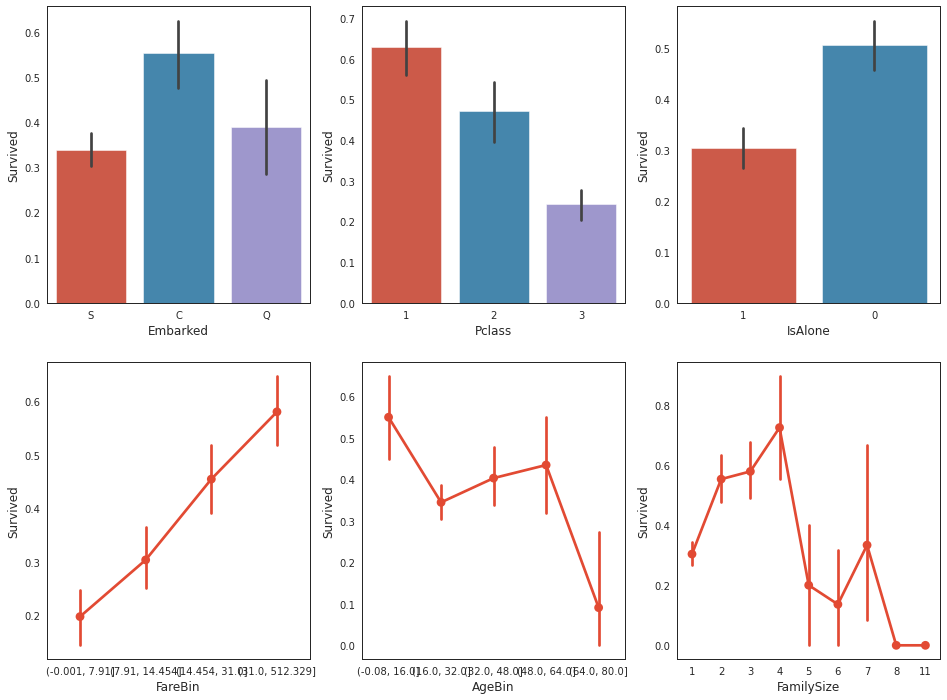

In [18]:
#graph individual features by survival
fig,saxis = plt.subplots(2,3,figsize=(16,12))
sns.barplot(x = 'Embarked',y = 'Survived',data=data1,ax=saxis[0,0])
sns.barplot(x='Pclass',y='Survived',order=[1,2,3],data=data1,ax=saxis[0,1])
sns.barplot(x='IsAlone',y='Survived',order=[1,0],data=data1,ax=saxis[0,2])

sns.pointplot(x='FareBin',y='Survived',data=data1,ax=saxis[1,0])
sns.pointplot(x='AgeBin',y='Survived',data=data1,ax=saxis[1,1])
sns.pointplot(x='FamilySize',y='Survived',data=data1,ax=saxis[1,2])

Text(0.5, 1.0, 'Pclass vs Family Size Survival Comparison')

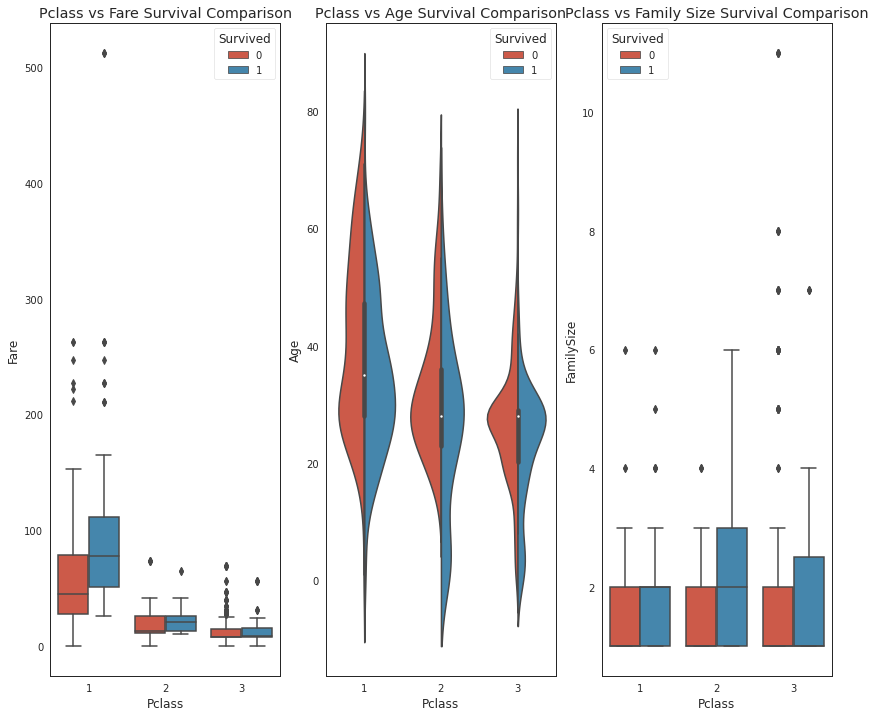

In [19]:
fig,(axis1,axis2,axis3) = plt.subplots(1,3,figsize=(14,12))

sns.boxplot(x='Pclass',y='Fare',hue='Survived',data=data1,ax=axis1)
axis1.set_title('Pclass vs Fare Survival Comparison')

sns.violinplot(x = 'Pclass',y = 'Age',hue='Survived',data=data1,split=True,ax=axis2)
axis2.set_title('Pclass vs Age Survival Comparison')

sns.boxplot(x='Pclass',y='FamilySize',hue='Survived',data=data1,ax=axis3)
axis3.set_title('Pclass vs Family Size Survival Comparison')

Text(0.5, 1.0, 'Sex vs Is Alone Survival Comparison')

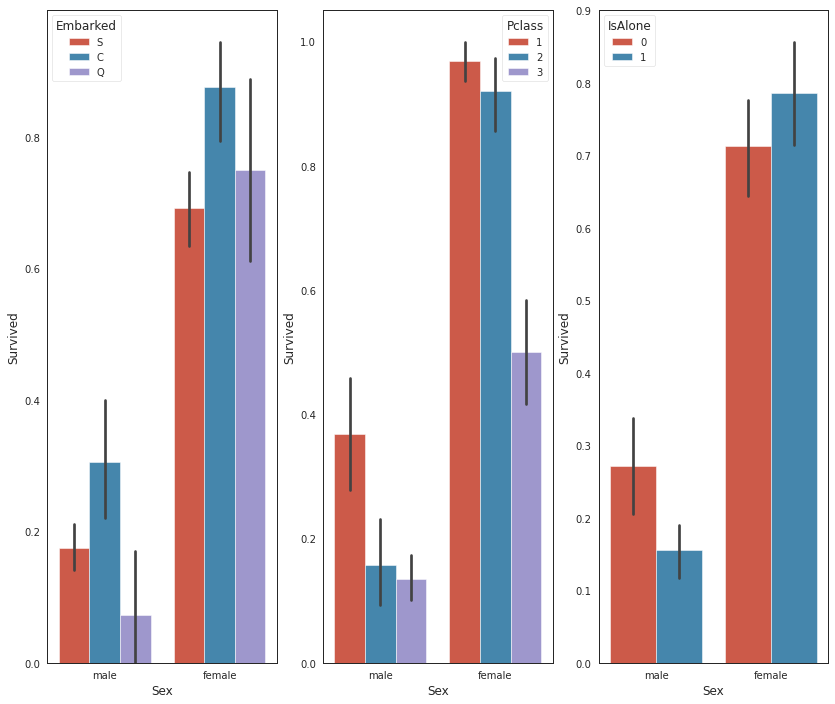

In [20]:
fig,qaxis = plt.subplots(1,3,figsize=(14,12))

sns.barplot(x = 'Sex',y = 'Survived',hue='Embarked',data=data1,ax=qaxis[0])
axis1.set_title('Sex vs Embarked Survival Comparison')

sns.barplot(x='Sex',y='Survived',hue='Pclass',data=data1,ax=qaxis[1])
axis1.set_title('Sex vs Pclass Survival Comparison')

sns.barplot(x = 'Sex',y='Survived',hue='IsAlone',data=data1,ax=qaxis[2])
axis1.set_title('Sex vs Is Alone Survival Comparison')

Figure(1008x864) AxesSubplot(0.125,0.125;0.352273x0.755) AxesSubplot(0.547727,0.125;0.352273x0.755)


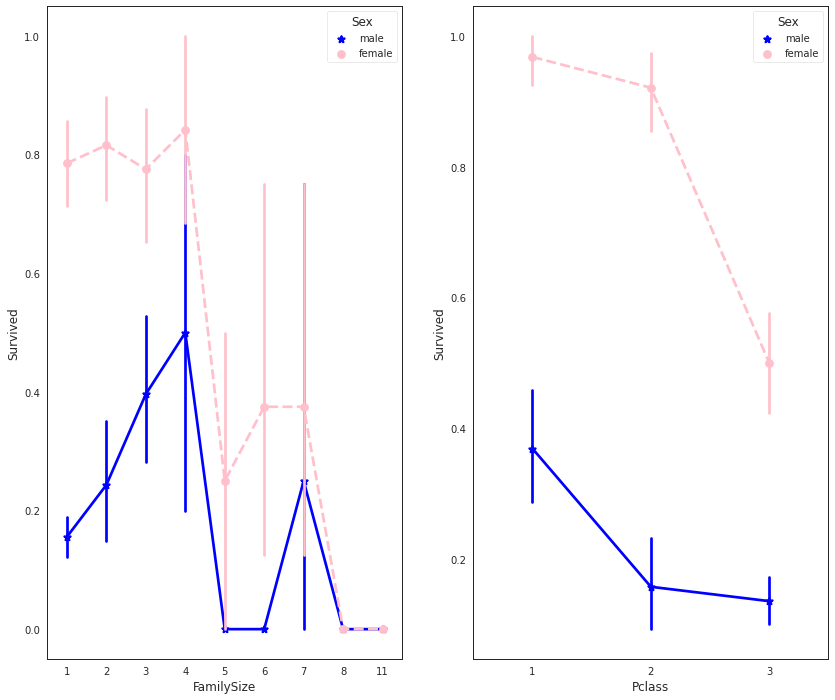

In [21]:
fig,(maxis1,maxis2) = plt.subplots(1,2,figsize=(14,12))
print(fig,maxis1,maxis2)

#how does family size factor witth sex & survival compare
sns.pointplot(x='FamilySize',y='Survived',hue='Sex',data=data1,
             palette={"male":"blue","female":"pink"},
             markers=["*","o"],linestyles=["-","--"],ax=maxis1)

#how does class factor with sex & survival compare
sns.pointplot(x="Pclass",y="Survived",hue="Sex",data=data1,
             palette={"male":"blue","female":"pink"},
             markers=["*","o"],linestyles=["-","--"],ax=maxis2)

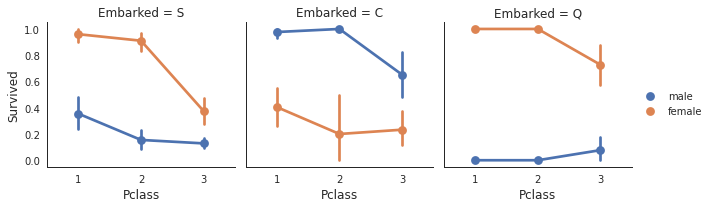

In [22]:
e = sns.FacetGrid(data1,col='Embarked')
e.map(sns.pointplot,"Pclass","Survived","Sex",ci=95.0,palette="deep")
e.add_legend()

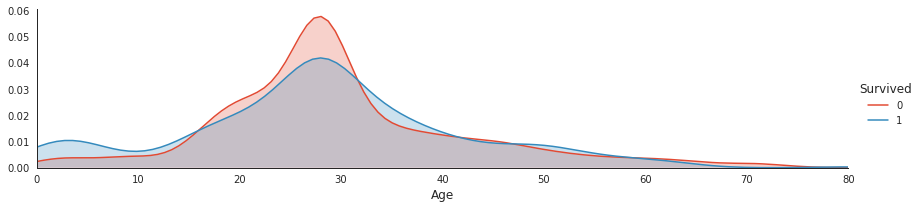

In [23]:
a = sns.FacetGrid(data1,hue="Survived",aspect=4)
a.map(sns.kdeplot,"Age",shade=True)
a.set(xlim=(0,data1["Age"].max()))
a.add_legend()

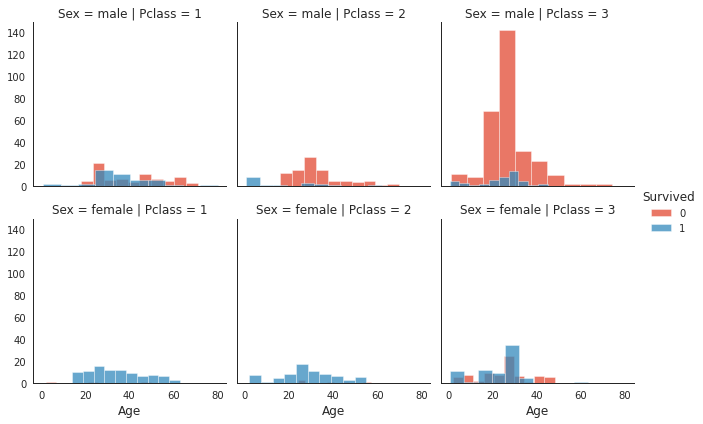

In [24]:
#histgram comparison of sex,class,and age by survival
h = sns.FacetGrid(data1,row='Sex',col="Pclass",hue="Survived")
h.map(plt.hist,"Age",alpha=.75)
h.add_legend()

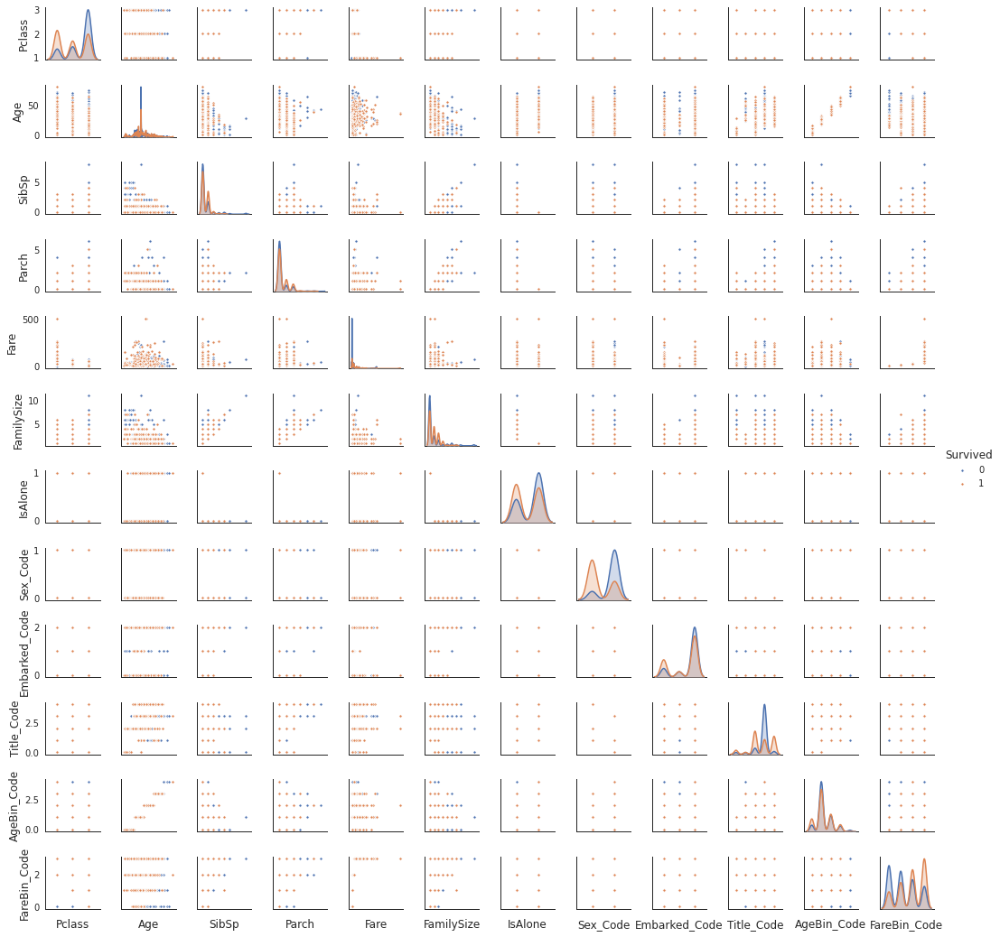

In [25]:
#pair plots lf entire dataset
pp = sns.pairplot(data1, hue = 'Survived', palette = 'deep', size=1.2, diag_kind = 'kde', diag_kws={"bw":0.2}, plot_kws=dict(s=10) )
pp.set(xticklabels=[])

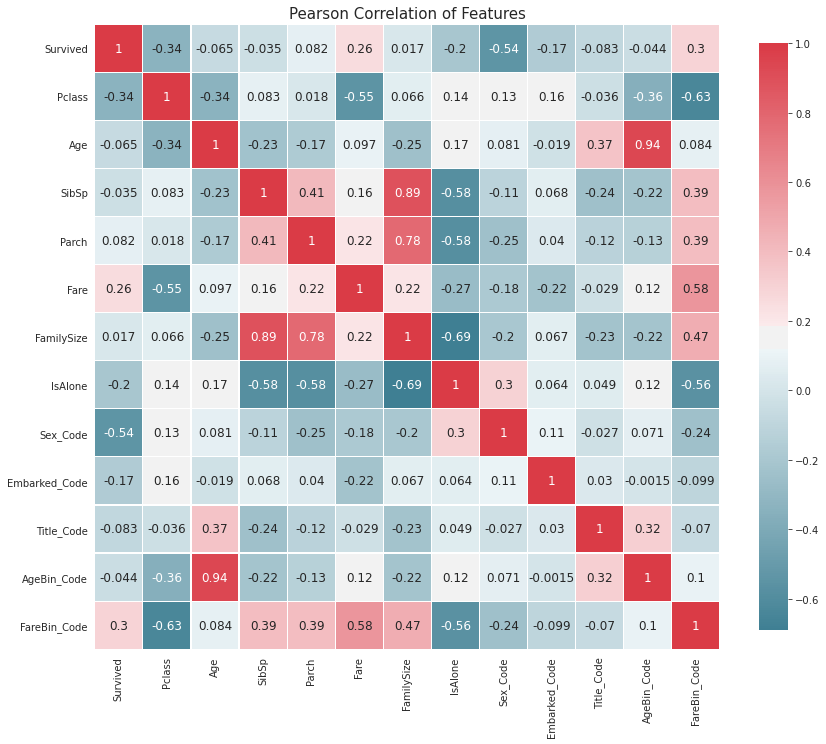

In [26]:
#correlation heatmap of dataset
def correlation_heatmap(df):
    _,ax = plt.subplots(figsize=(14,12))
    colormap = sns.diverging_palette(220,10,as_cmap=True)
    _ = sns.heatmap(
        df.corr(),
        cmap = colormap,
        square=True,
        cbar_kws={'shrink':.9},
        ax=ax,
        annot=True,
        linewidths=0.1,vmax=1.0,linecolor="white",
        annot_kws={"fontsize":12}
    )
    
    plt.title("Pearson Correlation of Features",y=1.05,size=15)
    
correlation_heatmap(data1)

In [27]:
MLA = [
    #Ensemble Methods
    ensemble.AdaBoostClassifier(),
    ensemble.BaggingClassifier(),
    ensemble.ExtraTreesClassifier(),
    ensemble.GradientBoostingClassifier(),
    ensemble.RandomForestClassifier(),
    
    #Gaussian Processes
    gaussian_process.GaussianProcessClassifier(),
    
    #GLM
    linear_model.LogisticRegressionCV(),
    linear_model.PassiveAggressiveClassifier(),
    linear_model.RidgeClassifierCV(),
    linear_model.SGDClassifier(),
    linear_model.Perceptron(),
    
    #Naives Bayes
    naive_bayes.BernoulliNB(),
    naive_bayes.GaussianNB(),
    
    #Nearest Neighbor
    neighbors.KNeighborsClassifier(),
    
    #SVM
    svm.SVC(probability=True),
    svm.NuSVC(probability=True),
    svm.LinearSVC(),
    
    #Trees
    tree.DecisionTreeClassifier(),
    tree.ExtraTreeClassifier(),
    
    #Discriminant Analysis
    discriminant_analysis.LinearDiscriminantAnalysis(),
    discriminant_analysis.QuadraticDiscriminantAnalysis(),
    
    #xgboost
    XGBClassifier()
]

#split dataset in cross-validation
cv_split = model_selection.ShuffleSplit(n_splits=10,test_size=.3,train_size=.6,random_state=618)#run model 10x with 60/30 split intentionally leaving out 10%

#create table to compare MLA metrics
MLA_columns = ["MLA Name","MLA Parameters","MLA Train Accuracy Mean","MLA Test Accuracy Mean","MLA Test Accuracy 3*STD","MLA Time"]
MLA_compare = pd.DataFrame(columns=MLA_columns)

#create table to compare MLA predictions
MLA_predict = data1[Target]

#index through MLA and save perfomrmance to table
row_index = 0
for alg in MLA:
    #set name and parameters
    MLA_name = alg.__class__.__name__
    MLA_compare.loc[row_index,"MLA Name"] = MLA_name
    MLA_compare.loc[row_index,"MLA Parameters"] = str(alg.get_params())
    
    #return_train_scoreがないとcv_results["train_score"]がkey error
    cv_results = model_selection.cross_validate(alg,data1[data1_x_bin],data1[Target],cv=cv_split,return_train_score=True)
    
    MLA_compare.loc[row_index,"MLA Time"] = cv_results["fit_time"].mean()
    MLA_compare.loc[row_index, 'MLA Train Accuracy Mean'] = cv_results["train_score"].mean()
    MLA_compare.loc[row_index,"MLA Test Accuracy Mean"] = cv_results["test_score"].mean()
    #if this is a non-bias random sample, then +/-3 standard deviations (std) from the mean, should statistically capture 99.7% of the subsets
    MLA_compare.loc[row_index,"MLA Test Accuracy 3*STD"] = cv_results["test_score"].std()*3
    
    #save MLA predictions 
    alg.fit(data1[data1_x_bin],data1[Target])
    MLA_predict[MLA_name] = alg.predict(data1[data1_x_bin])
    
    row_index += 1
    
MLA_compare.sort_values(by = ["MLA Test Accuracy Mean"],ascending=False,inplace=True)
MLA_compare

,MLA Name,MLA Parameters,MLA Train Accuracy Mean,MLA Test Accuracy Mean,MLA Test Accuracy 3*STD,MLA Time
15,NuSVC,"{'break_ties': False, 'cache_size': 200, 'clas...",0.832959,0.828731,0.078908,0.0347653
14,SVC,"{'C': 1.0, 'break_ties': False, 'cache_size': ...",0.835206,0.828358,0.0760865,0.0273718
21,XGBClassifier,"{'objective': 'binary:logistic', 'base_score':...",0.89382,0.813433,0.0772307,0.0404702
3,GradientBoostingClassifier,"{'ccp_alpha': 0.0, 'criterion': 'friedman_mse'...",0.866105,0.810821,0.0704513,0.0635566
4,RandomForestClassifier,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w...",0.898876,0.810448,0.0757233,0.151318
2,ExtraTreesClassifier,"{'bootstrap': False, 'ccp_alpha': 0.0, 'class_...",0.898876,0.808209,0.0983802,0.113355
20,QuadraticDiscriminantAnalysis,"{'priors': None, 'reg_param': 0.0, 'store_cova...",0.822097,0.808209,0.0619628,0.00249441
0,AdaBoostClassifier,"{'algorithm': 'SAMME.R', 'base_estimator': Non...",0.824719,0.807463,0.0621647,0.0681801
5,GaussianProcessClassifier,"{'copy_X_train': True, 'kernel': None, 'max_it...",0.868165,0.804851,0.0939299,0.0433964
1,BaggingClassifier,"{'base_estimator': None, 'bootstrap': True, 'b...",0.893071,0.803358,0.0799492,0.0212349


Text(0, 0.5, 'Algorithm')

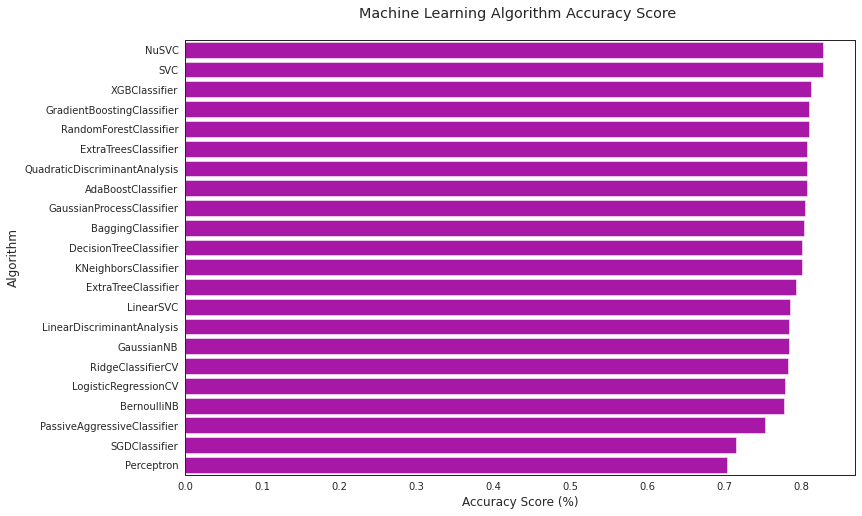

In [29]:
sns.barplot(x="MLA Test Accuracy Mean",y="MLA Name",data=MLA_compare,color="m")

plt.title("Machine Learning Algorithm Accuracy Score \n")
plt.xlabel("Accuracy Score (%)")
plt.ylabel("Algorithm")

In [30]:
#this is a handmade model for learning purposes only
for index,row in data1.iterrows():
    #random number generator
    if random.random() > .5:
        data1.at[index,"Random_Predict"] = 1 #predict survived
    else:
        data1.at[index,"Random_Predict"] = 0 #predict died/0
        
#score random guess of survival.Use shortcut 1 = Right Guess and 0 = Wrong Guess
data1["Random_Score"] = 0 #assume prediction wrong
data1.loc[(data1["Survived"] == data1["Random_Predict"]),"Random_Score"] = 1
print("Coin Flip Model Accuracy: {:.2f}%".format(data1["Random_Score"].mean()*100))

#scikitで同じことができる
print("Coin Flip Model Accuracy w/Scikit: {:.2f}%".format(metrics.accuracy_score(data1["Survived"],data1["Random_Predict"])*100))

Coin Flip Model Accuracy: 50.28%
Coin Flip Model Accuracy w/Scikit: 50.28%


In [31]:
pivot_female = data1[data1.Sex == "female"].groupby(["Sex","Pclass","Embarked","FareBin"])["Survived"].mean()
print("Survival Decesion Tree w/Female Node: \n",pivot_female)

pivot_male = data1[data1.Sex=="male"].groupby(["Sex","Title"])["Survived"].mean()
print("\n\nSurvival Decision Tree w/Male Node: \n",pivot_male)

Survival Decesion Tree w/Female Node: 
 Sex     Pclass  Embarked  FareBin        
female  1       C         (-0.001, 7.91]          NaN
                          (7.91, 14.454]          NaN
                          (14.454, 31.0]     0.666667
                          (31.0, 512.329]    1.000000
                Q         (-0.001, 7.91]          NaN
                          (7.91, 14.454]          NaN
                          (14.454, 31.0]          NaN
                          (31.0, 512.329]    1.000000
                S         (-0.001, 7.91]          NaN
                          (7.91, 14.454]          NaN
                          (14.454, 31.0]     1.000000
                          (31.0, 512.329]    0.955556
        2       C         (-0.001, 7.91]          NaN
                          (7.91, 14.454]     1.000000
                          (14.454, 31.0]     1.000000
                          (31.0, 512.329]    1.000000
                Q         (-0.001, 7.91]          NaN


In [32]:
#handmade data model using brain power (and Microsoft Excel Pivot Tables for quick calculations)
def mytree(df):
    #initialize table to store predictions
    Model = pd.DataFrame(data = {"Predict":[]})
    male_title = ["Master"]#survived titles
    
    for index,row in df.iterrows():
        #Question1:Were you on the Titanic;majority died
        Model.loc[index,"Predict"] = 0
        
        #Question2:Are you female;majority survived
        if df.loc[index,"Sex"] == "female":
            Model.loc[index,"Predict"] = 1
            
        #Question3A Female -Class and Question 4 Embarked gain minimum information
        
        #Question5B Female -FareBin;set anything less than .5 in female node decision tree back to 0
        if ((df.loc[index,"Sex"] == "female") & (df.loc[index,"Pclass"] == 3) &
            (df.loc[index,"Embarked"] == "S") & (df.loc[index,"Fare"] > 8)):
            Model.loc[index,"Predict"] = 0
            
        #Question 3B Male:Title;set anything greater than .5 to 1 for majority survived
        if ((df.loc[index,"Sex"] == "male") & (df.loc[index,"Title"] in male_title)):
            Model.loc[index,"Predict"] = 1
            
    return Model

Tree_Predict = mytree(data1)
print("Decision Tree Model Accuracy/Precision Score: {:.2f}%\n".format(metrics.accuracy_score(data1["Survived"],Tree_Predict)*100))


print(metrics.classification_report(data1["Survived"],Tree_Predict))

Decision Tree Model Accuracy/Precision Score: 82.04%

              precision    recall  f1-score   support

           0       0.82      0.91      0.86       549
           1       0.82      0.68      0.75       342

    accuracy                           0.82       891
   macro avg       0.82      0.79      0.80       891
weighted avg       0.82      0.82      0.82       891



Confusion matrix without normalization
[[497  52]
 [108 234]]
Normalized confusion matrix
[[0.91 0.09]
 [0.32 0.68]]


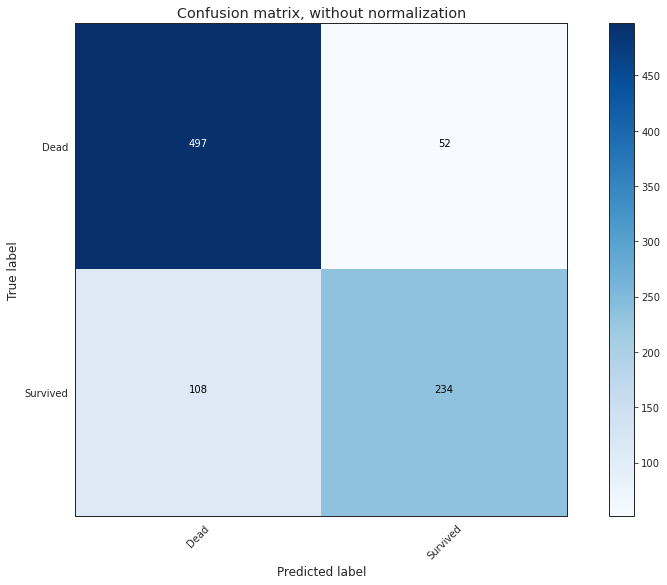

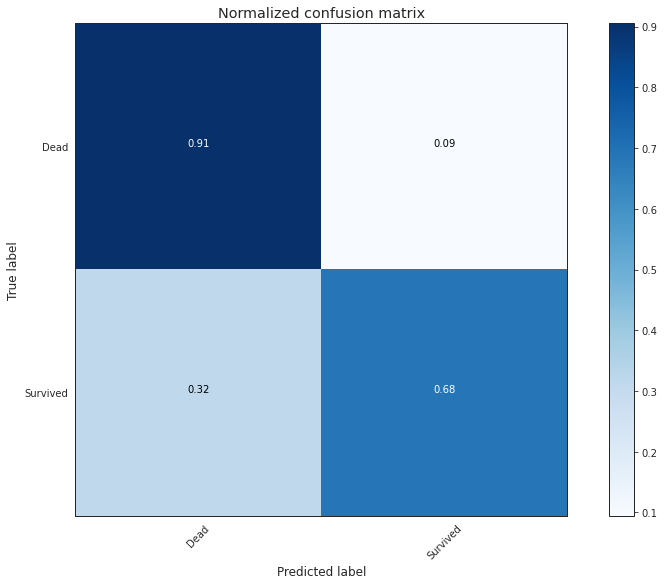

In [33]:
#plot Accuracy Summary

import itertools
def plot_confusion_matrix(cm,classes,
                          normalize=False,title="Confusion matrix",
                          cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype("float") / cm.sum(axis=1)[:,np.newaxis]
        print("Normalized confusion matrix")
    else:
        print("Confusion matrix without normalization")
        
    print(cm)
    
    plt.imshow(cm,interpolation="nearest",cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks,classes,rotation=45)
    plt.yticks(tick_marks,classes)
    
    fmt = ".2f" if normalize else "d"
    thresh = cm.max() / 2
    for i,j in itertools.product(range(cm.shape[0]),range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
                
    plt.tight_layout()
    plt.ylabel("True label")
    plt.xlabel("Predicted label")
    
cnf_matrix = metrics.confusion_matrix(data1["Survived"],Tree_Predict)
np.set_printoptions(precision=2)

class_names = ["Dead","Survived"]
plt.figure()
plot_confusion_matrix(cnf_matrix,classes=class_names,
                     title="Confusion matrix, without normalization")

plt.figure()
plot_confusion_matrix(cnf_matrix,classes=class_names,normalize=True,
                     title="Normalized confusion matrix")

In [41]:
#model performance with cross-validation
#use ParameterGrid,GridSearchCV,graphviz
#base model
dtree = tree.DecisionTreeClassifier(random_state=618)
base_results = model_selection.cross_validate(dtree,data1[data1_x_bin],data1[Target],cv=cv_split,return_train_score=True)
dtree.fit(data1[data1_x_bin],data1[Target])

print("BEFORE DT Parameters: ",dtree.get_params())
print("BEFORE DT Training w/bin score mean: {:.2f}".format(base_results["train_score"].mean()*100))
print("BEFORE DT Test w/bin score mean: {:.2f}".format(base_results["test_score"].mean()*100))
print("BEFORE DT Test w/bin score 3*std: +/- {:.2f}".format(base_results["test_score"].std()*100*3))
print("-"*10)

#tune hyper-parameters
param_grid = {"criterion":["gini","entropy"],
            "max_depth":[2,4,6,8,10,None],
            "random_state":[618]
            }

#choose best model with grid_search
tune_model = model_selection.GridSearchCV(tree.DecisionTreeClassifier(),param_grid=param_grid,scoring="roc_auc",cv=cv_split,return_train_score=True)
tune_model.fit(data1[data1_x_bin],data1[Target])

print("AFTeR DT Parameters: ",tune_model.best_params_)
print("AFTER DT Training w/bin score mean: {:.2f}".format(tune_model.cv_results_["mean_train_score"][tune_model.best_index_]*100))
print("AFTER DT Test w/bin score mean: {:.2f}".format(tune_model.cv_results_["mean_test_score"][tune_model.best_index_]*100))
print("AFTER DT Test w/bin score 3*std: +/- {:.2f}".format(tune_model.cv_results_["std_test_score"][tune_model.best_index_]*100*3))
print("-"*10)

BEFORE DT Parameters:  {'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'presort': 'deprecated', 'random_state': 618, 'splitter': 'best'}
BEFORE DT Training w/bin score mean: 89.89
BEFORE DT Test w/bin score mean: 80.22
BEFORE DT Test w/bin score 3*std: +/- 8.39
----------
AFTeR DT Parameters:  {'criterion': 'entropy', 'max_depth': 4, 'random_state': 618}
AFTER DT Training w/bin score mean: 89.75
AFTER DT Test w/bin score mean: 86.88
AFTER DT Test w/bin score 3*std: +/- 6.96
----------


In [50]:
#feature selection
#base model
print("BEFORE DT PRE Training Shape Old: ",data1[data1_x_bin].shape)
print("BEFORE DT PRE Training Columns: ",data1[data1_x_bin].columns.values)

print("BEFORE DT PRE Training w/bin score mean: {:.2f}".format(base_results["train_score"].mean()*100))
print("BEFORE DT PRE Test w/bin score mean: {:.2f}".format(base_results["test_score"].mean()*100))
print("BEFORE DT PRE Test w/bin score  3+std: +/- {:2f}".format(base_results["test_score"].std()*100*3))

#feature selection
dtree_rfe = feature_selection.RFECV(dtree,step=1,scoring="accuracy",cv=cv_split)
dtree_rfe.fit(data1[data1_x_bin],data1[Target])

X_rfe = data1[data1_x_bin].columns.values[dtree_rfe.get_support()]
rfe_results = model_selection.cross_validate(dtree,data1[X_rfe],data1[Target],cv=cv_split,return_train_score=True)

print("AFTER DT PFE Tuned Parameters: ",data1[X_rfe].shape)
print("AFTER DT PRE Training Columns New: ",X_rfe)

print("AFTER DT PRE Training w/bin score mean: {:.2f}".format(rfe_results["train_score"].mean()*100))
print("AFTER DT ORE Test w/bin score mean: {:.2f}".format(rfe_results["test_score"].mean()*100))
print("AFTER DT PRE Test w/bin score 3*std: +/- {:.2f}".format(rfe_results["test_score"].std()*100*3))
print("-"*10)

#tune rfe model 
rfe_tune_model = model_selection.GridSearchCV(tree.DecisionTreeClassifier(),param_grid=param_grid,scoring="roc_auc",cv=cv_split,return_train_score=True)
rfe_tune_model.fit(data1[X_rfe],data1[Target])

print("AFTER DT PRE Tuned Parameters: ",rfe_tune_model.best_params_)
print("AFTER DT PRE Tuned Training w/bin score mean: {:.2f}".format(rfe_tune_model.cv_results_["mean_train_score"][tune_model.best_index_]*100))
print("AFTER DT PRE Tuned Test w/bin score mean: {:.2f}".format(rfe_tune_model.cv_results_["mean_test_score"][tune_model.best_index_]*100))
print("AFTER DT PRE Tuned Test w/bin score 3*std: +/- {:.2f}".format(rfe_tune_model.cv_results_["std_test_score"][tune_model.best_index_]*100*3))
print("-"*10)


BEFORE DT PRE Training Shape Old:  (891, 7)
BEFORE DT PRE Training Columns:  ['Sex_Code' 'Pclass' 'Embarked_Code' 'Title_Code' 'FamilySize'
 'AgeBin_Code' 'FareBin_Code']
BEFORE DT PRE Training w/bin score mean: 89.89
BEFORE DT PRE Test w/bin score mean: 80.22
BEFORE DT PRE Test w/bin score  3+std: +/- 8.391790
AFTER DT PFE Tuned Parameters:  (891, 6)
AFTER DT PRE Training Columns New:  ['Sex_Code' 'Pclass' 'Title_Code' 'FamilySize' 'AgeBin_Code'
 'FareBin_Code']
AFTER DT PRE Training w/bin score mean: 88.60
AFTER DT ORE Test w/bin score mean: 81.19
AFTER DT PRE Test w/bin score 3*std: +/- 9.98
----------
AFTER DT PRE Tuned Parameters:  {'criterion': 'entropy', 'max_depth': 4, 'random_state': 618}
AFTER DT PRE Tuned Training w/bin score mean: 89.65
AFTER DT PRE Tuned Test w/bin score mean: 87.15
AFTER DT PRE Tuned Test w/bin score 3*std: +/- 6.33
----------


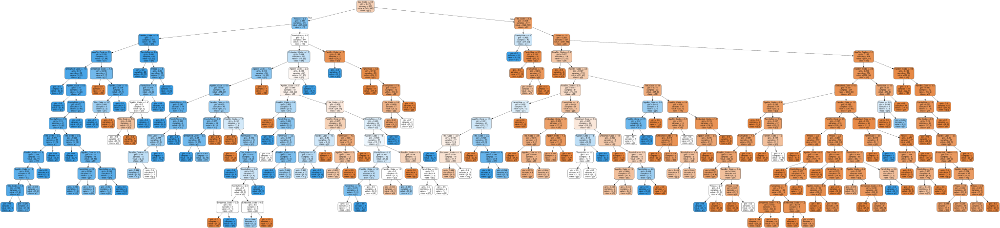

In [51]:
#Graph MLA version of Decision Tree
import graphviz
dot_data = tree.export_graphviz(dtree,out_file=None,
                                feature_names=data1_x_bin,class_names=True,
                                filled=True,rounded=True)

graph = graphviz.Source(dot_data)
graph

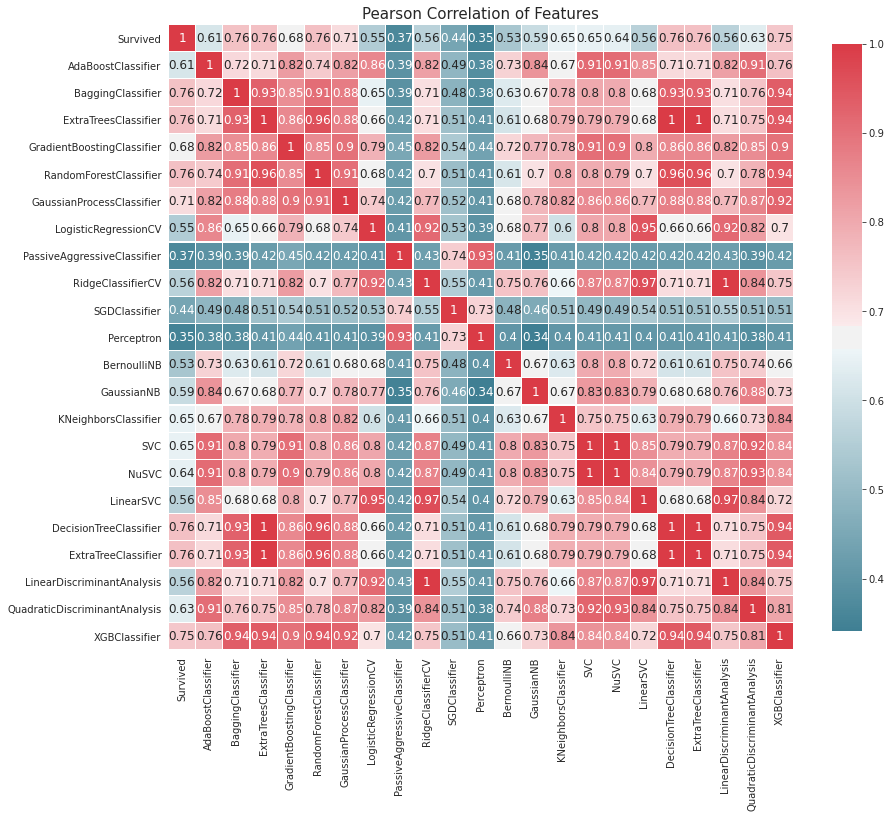

In [52]:
#compare algorithm predictions with each other,where 1 = exactly similar and 0 = exactly opposite
"There are some 1's,but enogh blues and light reds to create a super algorithm by combining them"
correlation_heatmap(MLA_predict)